In [8]:
!pip install laspy

   ---------------------------------------- 0.0/84.3 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/84.3 kB ? eta -:--:--
   ---------------------------------------- 84.3/84.3 kB 1.6 MB/s eta 0:00:00


In [ ]:
# Imports
# import os
# import re
# import csv
# import typing
# import itertools
# import json
# import logging
# import warnings
# import evaluate
# import types
import pandas as pd
import sklearn as sk
import numpy as np
# import torch
# import math
import shapely

import matplotlib.pyplot as plt
import laspy # Reading LAS file format
import download_script
from tqdm import tqdm # Loading bars
import geopandas as gpd

In [3]:
def gather_data():
    download_script.main()

In [4]:
# Load area points from the text file and create a polygon
def load_area_polygon(file_path):
    coordinates = []
    with open(file_path, 'r') as f:
        for line in f:
            if len(line.split()) == 3:
                _, x, y = line.strip().split()
                coordinates.append((float(y), float(x)))  # Swap X and Y for the polygon
    return shapely.Polygon(coordinates)

In [5]:
# Modify LAS points' classification inside the polygon
def classify_points_in_area(las_file_path, polygon, new_classification, output_path):
    # Load the LAS file
    las = laspy.read(las_file_path)
    
    # Extract LAS point X, Y (swapped) coordinates as tuples
    points = np.column_stack((las.y, las.x))  # Swap X and Y
    
    # Create a mask for points inside the polygon
    mask = np.array([polygon.contains(shapely.Point(pt)) for pt in points])

    # Apply the new classification to points within the polygon
    las.classification[mask] = new_classification
    
    # Write modified points to a new LAS file
    las.write(output_path)

In [6]:
# Rasterize a shapely polygon for overlay
def rasterize_polygon(polygon, x_min, x_max, y_min, y_max, resolution):
    grid = np.zeros((resolution, resolution), dtype=np.uint8)
    x_range = np.linspace(x_min, x_max, resolution)
    y_range = np.linspace(y_min, y_max, resolution)
    
    for i, y in enumerate(y_range):
        for j, x in enumerate(x_range):
            if polygon.contains(shapely.Point(x, y)):
                grid[i, j] = 1  # Mask for polygon
    return grid

In [7]:
# Function to blend mask into an image with transparency
def apply_transparency(image, mask, mask_color, alpha):
    # Create a copy of the original image to avoid overwriting
    blended_image = image.copy()
    
    # Get indices where the mask is active
    mask_indices = mask == 1  # Binary mask where 1 indicates the mask area
    
    # Blend mask color with the original image in the masked region
    for channel in range(3):  # Loop over RGB channels
        blended_image[..., channel][mask_indices] = (
            (1 - alpha) * blended_image[..., channel][mask_indices] + alpha * mask_color[channel]
        )
    
    return blended_image

In [8]:
def preprocess_data():
    mask_hillforts()

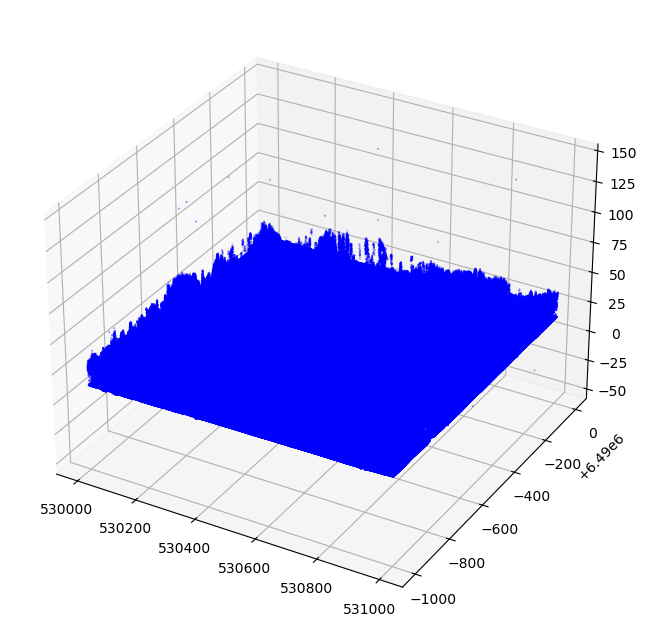

In [ ]:
import laspy
import matplotlib.pyplot as plt

las = laspy.read('../data/lazFiles/489530_2021_tava.laz') # Tuleb ära muuta

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(las.x, las.y, las.z, c='b', marker='o', s=0.1)

In [3]:
display(las.xyz)
display(las.xyz.shape)

array([[5.30000020e+05, 6.48900295e+06, 2.46500000e+01],
       [5.30000220e+05, 6.48900210e+06, 2.47000000e+01],
       [5.30000290e+05, 6.48900181e+06, 2.65500000e+01],
       ...,
       [5.30999840e+05, 6.48999636e+06, 1.63600000e+01],
       [5.30999990e+05, 6.48999924e+06, 3.62100000e+01],
       [5.30999980e+05, 6.48999931e+06, 3.44000000e+01]])

(3066369, 3)

In [3]:
print(min(las.x), max(las.x))
print(min(las.y), max(las.y))

530000.0 530999.99
6489000.0 6489999.99


In [5]:
las.y

<ScaledArrayView([6489002.95 6489002.1  6489001.81 ... 6489996.36 6489999.24 6489999.31])>

In [6]:
las.z

<ScaledArrayView([24.65 24.7  26.55 ... 16.36 36.21 34.4 ])>

In [24]:
las.point_format.id

8

In [27]:
list(las.point_format.dimension_names)

['X',
 'Y',
 'Z',
 'intensity',
 'return_number',
 'number_of_returns',
 'synthetic',
 'key_point',
 'withheld',
 'overlap',
 'scanner_channel',
 'scan_direction_flag',
 'edge_of_flight_line',
 'classification',
 'user_data',
 'scan_angle',
 'point_source_id',
 'gps_time',
 'red',
 'green',
 'blue',
 'nir',
 'Amplitude',
 'Pulse width',
 'Reflectance',
 'Deviation']

In [28]:
list(las.point_format.extra_dimension_names)

['Amplitude', 'Pulse width', 'Reflectance', 'Deviation']

laspy name | size (bits) | type
| ------ | -------- | -------- |
u1 or uint8 | 8 | unsigned
i1 or int8 | 8 | signed
u2 or uint16 | 16 | unsigned
i2 or int16 | 16 | signed
u4 or uint32 | 32 | unsigned
i4 or int32 | 32 | signed
u8 or uint64 | 64 | unsigned
i8 or int64 | 64 | signed
f4 or float32 | 32 | floating
f8 or float64 | 64 | floating

In [48]:
las.points.array

array([(53000002, 648900295, 2465, 45372, 34, 16, 5, 120, 3333, 21068, 3.02856184e+08, 15616, 20736, 11776, 45056, 1052, 0,  -423,  5),
       (53000022, 648900210, 2470, 39801, 17, 16, 5, 121, 3333, 21068, 3.02856184e+08, 26368, 32512, 19712, 54528,  797, 0,  -678,  3),
       (53000029, 648900181, 2655, 36131, 34, 16, 5, 139, 3333, 21068, 3.02856184e+08, 25344, 31488, 19200, 52736,  630, 0,  -846,  6),
       ...,
       (53099984, 648999636, 1636, 50593, 17, 16, 1,   1, -333, 21068, 3.02856200e+08, 27392, 26624, 18688, 41472, 1355, 0,  -184,  7),
       (53099999, 648999924, 3621, 24335, 49, 16, 5, 199, -333, 21068, 3.02856200e+08, 16128, 17920, 13824, 34048,  161, 0, -1386,  1),
       (53099998, 648999931, 3440, 39211, 50, 16, 5, 181, -333, 21068, 3.02856200e+08, 16128, 17920, 13824, 34048,  841, 0,  -705, 14)],
      dtype=[('X', '<i4'), ('Y', '<i4'), ('Z', '<i4'), ('intensity', '<u2'), ('bit_fields', 'u1'), ('classification_flags', 'u1'), ('classification', 'u1'), ('user_data', 

In [34]:
import numpy as np
np.unique(las.points.classification, return_counts=True) # unique, counts

(array([ 1,  2,  5,  6,  7,  9, 18], dtype=uint8),
 array([ 470598, 1687383,  904615,    3401,      10,     256,     106],
       dtype=int64))

In [6]:
dir(las.point_format)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'add_extra_dimension',
 'dimension_by_name',
 'dimension_names',
 'dimensions',
 'dtype',
 'extra_dimension_names',
 'extra_dimensions',
 'has_waveform_packet',
 'id',
 'num_extra_bytes',
 'num_standard_bytes',
 'remove_extra_dimension',
 'size',
 'standard_dimension_names',
 'standard_dimensions']

In [7]:
las.point_format.id

8

In [8]:
dir(las)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_points',
 '_write_to',
 'add_extra_dim',
 'add_extra_dims',
 'change_scaling',
 'evlrs',
 'header',
 'point_format',
 'points',
 'remove_extra_dim',
 'remove_extra_dims',
 'update_header',
 'vlrs',
 'write',
 'xyz']

Text(0.5, 1.0, 'Depth Map from LiDAR')

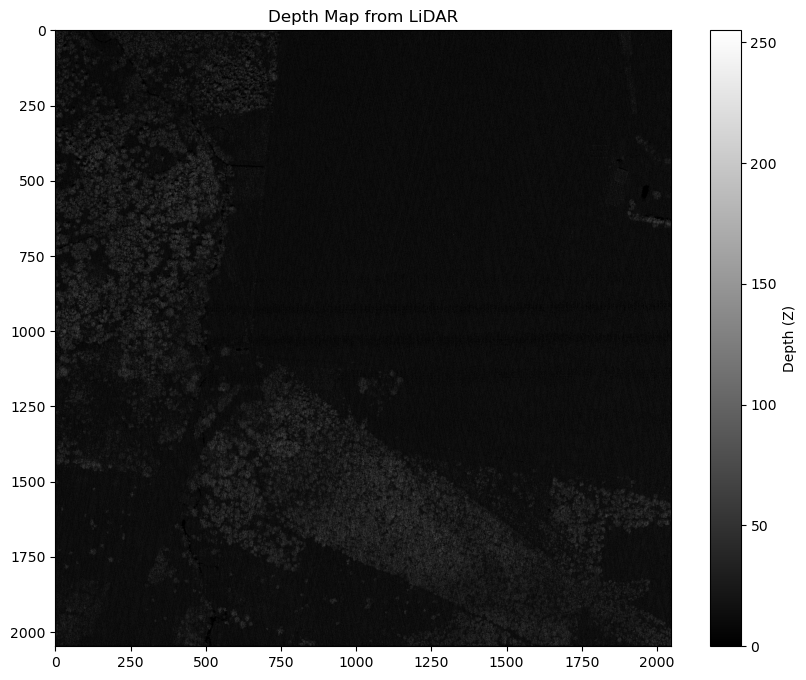

In [52]:
# Extract X, Y, Z coordinates from the point cloud
x = las.x
y = las.y
z = las.z

# Normalize X, Y to fit into a 2D grid (pixel coordinates)
# Assuming a fixed resolution for the depth map
resolution = 2048  # Resolution of the output depth map (nxn pixels)
x_min, x_max = np.min(x), np.max(x)
y_min, y_max = np.min(y), np.max(y)

# Normalize x, y coordinates into the range of (0, resolution)
x_norm = ((x - x_min) / (x_max - x_min)) * (resolution - 1)
y_norm = ((y - y_min) / (y_max - y_min)) * (resolution - 1)

# Create an empty 2D grid for the depth map
depth_map = np.zeros((resolution, resolution))

# Populate the grid with Z values (depth)
# We use the maximum Z value for each pixel to get the "top" points.
for i in range(len(x_norm)):
    xi = int(x_norm[i])
    yi = int(y_norm[i])
    depth_map[yi, xi] = max(depth_map[yi, xi], z[i])

# Normalize the depth values to a range of [0, 255] for visualization
depth_map_normalized = 255 * (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map))
depth_map_normalized = depth_map_normalized.astype(np.uint8)

# Visualize and save the depth map as an image
plt.figure(figsize=(10, 8))
plt.imshow(depth_map_normalized, cmap='gray')
plt.colorbar(label='Depth (Z)')
plt.title('Depth Map from LiDAR')

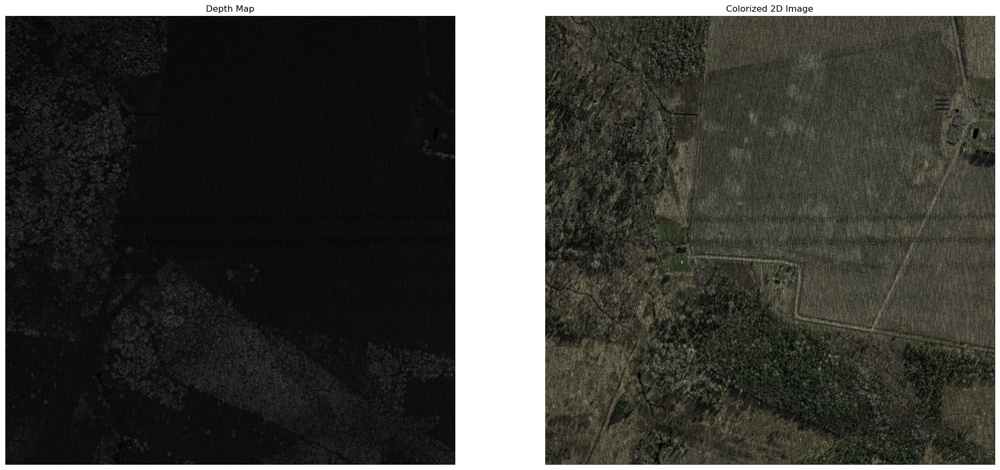

In [ ]:
# Extract X, Y, Z coordinates and color information (red, green, blue)
x = las.x
y = las.y
z = las.z
red = las.red
green = las.green
blue = las.blue

# Normalize X, Y to fit into a 2D grid (for the depth map and color image)
resolution = 512  # Output resolution for the images (nxn pixels)
x_min, x_max = np.min(x), np.max(x)
y_min, y_max = np.min(y), np.max(y)

# Normalize x and y to fit the 2D image grid
x_norm = ((x - x_min) / (x_max - x_min)) * (resolution - 1)
y_norm = ((y - y_min) / (y_max - y_min)) * (resolution - 1)

# Create empty arrays for depth map and color image
depth_map = np.zeros((resolution, resolution))
color_image = np.zeros((resolution, resolution, 3), dtype=np.uint8)  # 3 channels for RGB

# Populate the depth map and color image
for i in range(len(x_norm)):
    xi = int(x_norm[i])
    yi = int(y_norm[i])
    
    # Depth map: take maximum Z value for each pixel
    depth_map[yi, xi] = max(depth_map[yi, xi], z[i])
    
    # Color image: set red, green, blue values (normalize to 0-255)
    color_image[yi, xi, 0] = red[i] / 65535 * 255  # Normalize 16-bit to 8-bit
    color_image[yi, xi, 1] = green[i] / 65535 * 255
    color_image[yi, xi, 2] = blue[i] / 65535 * 255

# Normalize the depth map to the range [0, 255]
depth_map_normalized = 255 * (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map))
depth_map_normalized = depth_map_normalized.astype(np.uint8)

# Plot both depth map and colorized image side by side
fig, axs = plt.subplots(1, 2, figsize=(24, 18))

# Depth map (left)
axs[0].imshow(depth_map_normalized, cmap='gray')
axs[0].set_title('Depth Map')
axs[0].axis('off')

# Colorized image (right)
axs[1].imshow(color_image)
axs[1].set_title('Colorized 2D Image')
axs[1].axis('off')
plt.show()

(490517.75, 6505860.8, 490894.93, 6506200.29)

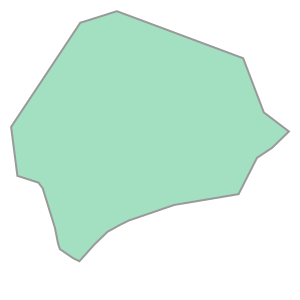

In [ ]:
hillfort_area = load_area_polygon('241_V2.txt')
display(hillfort_area.bounds)
display(hillfort_area)

In [ ]:
las = laspy.read('../data/lazFiles/506490_2024_madal.laz') # Tuleb ära muuta
hillfort_area = load_area_polygon('../data/temp/241.txt') # Lihula mõisa pargi hulknurga koordinaadid (saab kätte Geoportaalist)

100%|██████████| 7055853/7055853 [00:56<00:00, 124453.87it/s]


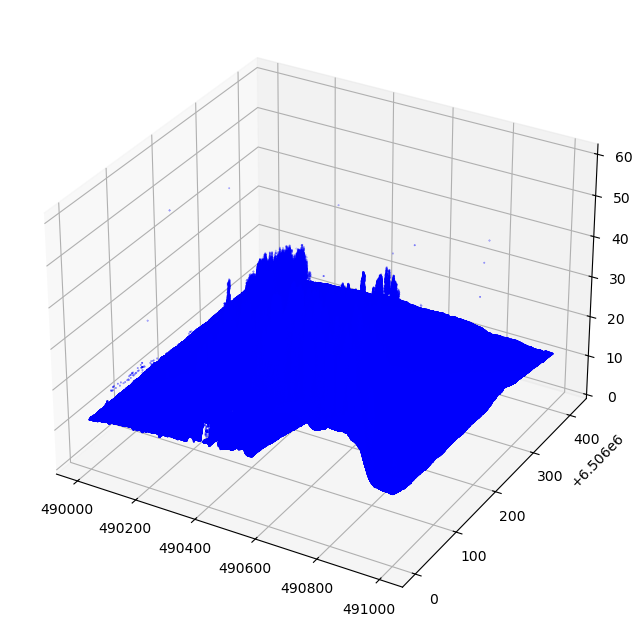

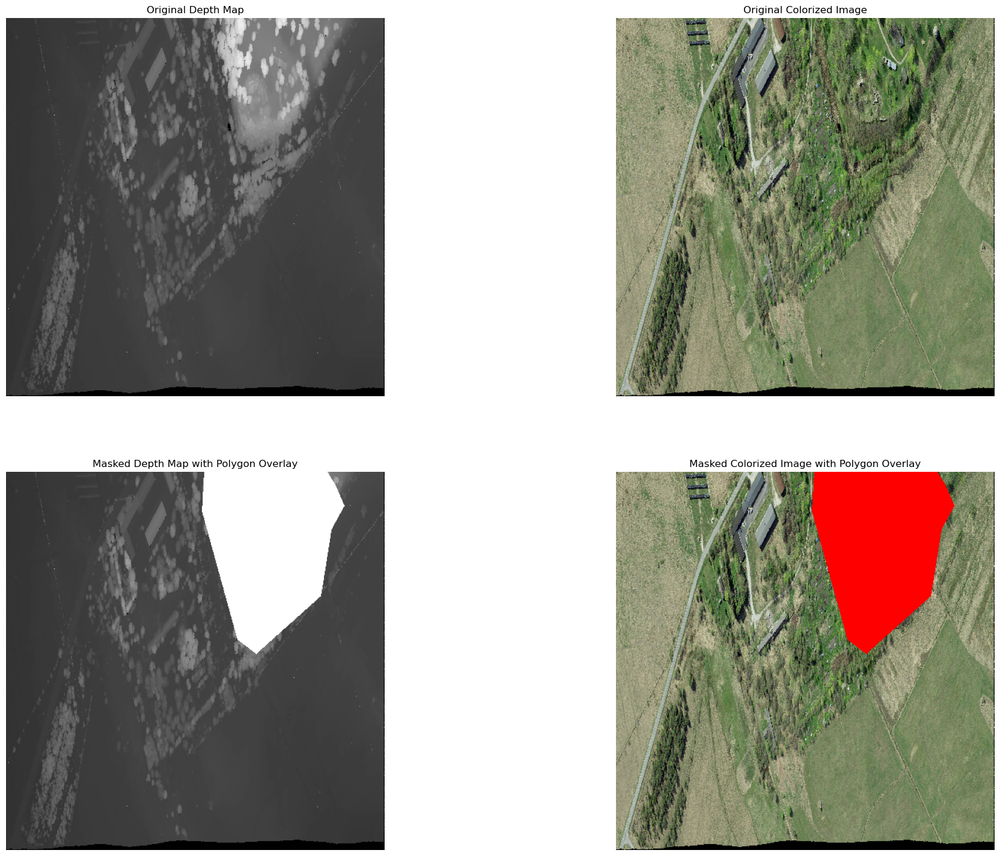

In [ ]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(las.x, las.y, las.z, c='b', marker='o', s=0.1)
# Extract X, Y, Z coordinates and color information (red, green, blue)
x = las.x
y = las.y
z = las.z
red = las.red
green = las.green
blue = las.blue

# Normalize X, Y to fit into a 2D grid (for the depth map and color image)
resolution = 512  # Output resolution for the images (nxn pixels)
x_min, x_max = np.min(x), np.max(x)
y_min, y_max = np.min(y), np.max(y)

# Normalize x and y to fit the 2D image grid
x_norm = ((x - x_min) / (x_max - x_min)) * (resolution - 1)
y_norm = ((y - y_min) / (y_max - y_min)) * (resolution - 1)

# Create empty arrays for depth map and color image
depth_map = np.zeros((resolution, resolution))
color_image = np.zeros((resolution, resolution, 3), dtype=np.uint8)  # 3 channels for RGB

# Populate the depth map and color image
for i in tqdm(range(len(x_norm))):
    xi = int(x_norm[i])
    yi = int(y_norm[i])
    
    # Depth map: take maximum Z value for each pixel
    depth_map[yi, xi] = max(depth_map[yi, xi], z[i])
    
    # Color image: set red, green, blue values (normalize to 0-255)
    color_image[yi, xi, 0] = red[i] / 65535 * 255  # Normalize 16-bit to 8-bit
    color_image[yi, xi, 1] = green[i] / 65535 * 255
    color_image[yi, xi, 2] = blue[i] / 65535 * 255

# Normalize the depth map to the range [0, 255]
depth_map_normalized = 255 * (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map))
depth_map_normalized = depth_map_normalized.astype(np.uint8)

# Rasterize the polygon mask
polygon_mask = rasterize_polygon(hillfort_area, x_min, x_max, y_min, y_max, resolution)

# Overlay polygon mask onto depth map and colorized image
masked_depth_map = np.where(polygon_mask == 1, 255, depth_map_normalized)
masked_color_image = np.copy(color_image)
masked_color_image[polygon_mask == 1] = [255, 0, 0]  # Highlight mask in red

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(24, 18))

# Original Depth Map
axs[0, 0].imshow(depth_map_normalized, cmap='gray')
axs[0, 0].set_title('Original Depth Map')
axs[0, 0].axis('off')

# Original Colorized Image
axs[0, 1].imshow(color_image)
axs[0, 1].set_title('Original Colorized Image')
axs[0, 1].axis('off')

# Masked Depth Map
axs[1, 0].imshow(masked_depth_map, cmap='gray')
axs[1, 0].set_title('Masked Depth Map with Polygon Overlay')
axs[1, 0].axis('off')

# Masked Colorized Image
axs[1, 1].imshow(masked_color_image)
axs[1, 1].set_title('Masked Colorized Image with Polygon Overlay')
axs[1, 1].axis('off')

plt.show()

In [11]:
print(min(las.x), max(las.x))
print(min(las.y), max(las.y))

490000.0 490999.99
6506000.0 6506415.93


In [13]:
print(las.points)

<ScaleAwarePointRecord(fmt: <PointFormat(8, 8 bytes of extra dims)>, len: 7055853, point size: 46)>


100%|██████████| 3004416/3004416 [00:23<00:00, 125517.80it/s]


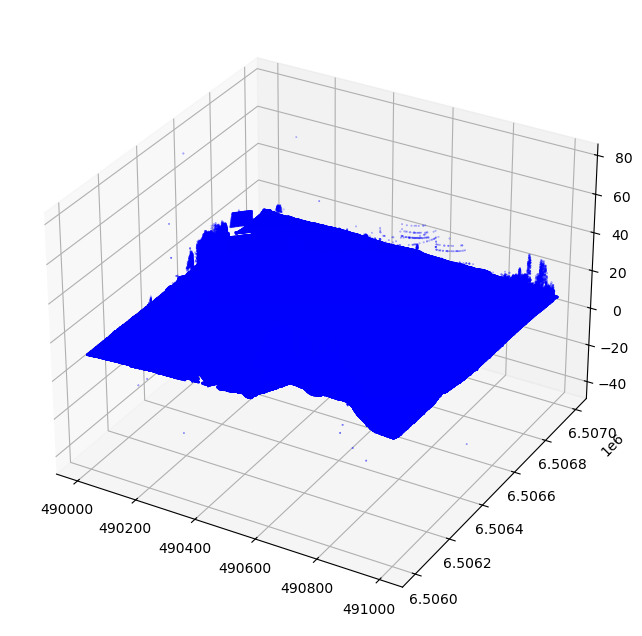

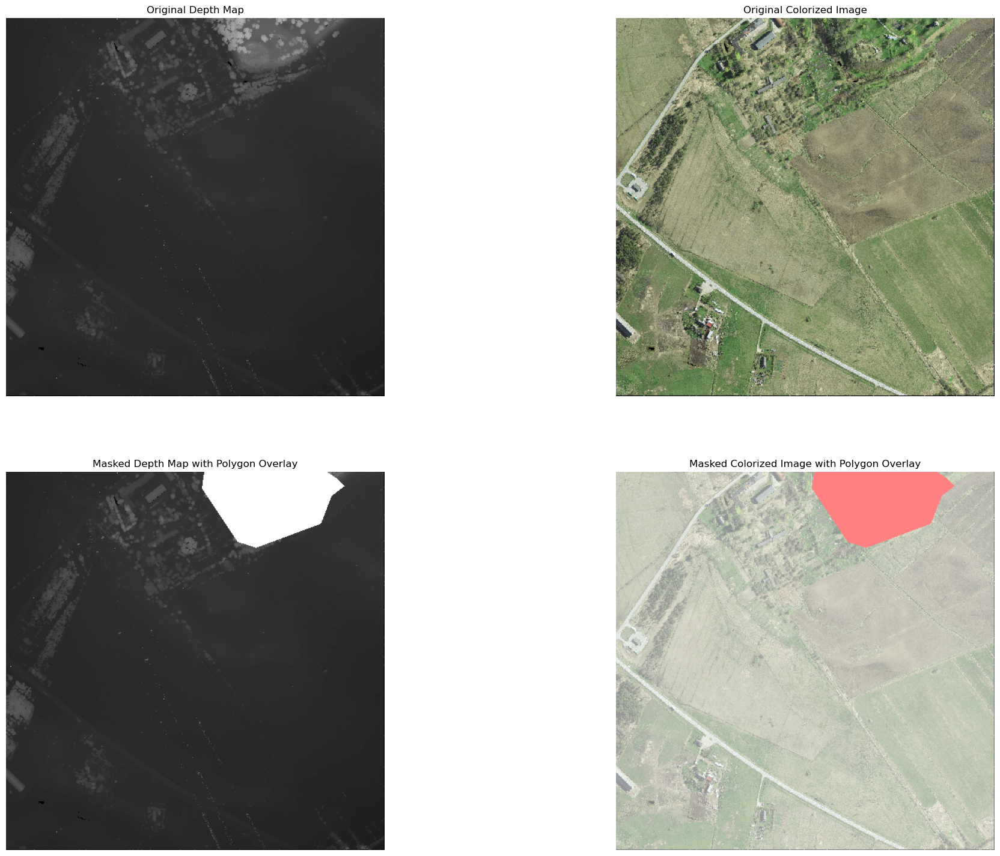

In [ ]:
las = laspy.read('../data/lazFiles/506490_2020_tava.laz') # Tuleb ära muuta
hillfort_area = load_area_polygon('../data/temp/241.txt') # Lihula mõisa pargi hulknurga koordinaadid (saab kätte Geoportaalist)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(las.x, las.y, las.z, c='b', marker='o', s=0.1)
# Extract X, Y, Z coordinates and color information (red, green, blue)
x = las.x
y = las.y
z = las.z
red = las.red
green = las.green
blue = las.blue

# Normalize X, Y to fit into a 2D grid (for the depth map and color image)
resolution = 512  # Output resolution for the images (nxn pixels)
x_min, x_max = np.min(x), np.max(x)
y_min, y_max = np.min(y), np.max(y)

# Normalize x and y to fit the 2D image grid
x_norm = ((x - x_min) / (x_max - x_min)) * (resolution - 1)
y_norm = ((y - y_min) / (y_max - y_min)) * (resolution - 1)

# Create empty arrays for depth map and color image
depth_map = np.zeros((resolution, resolution))
color_image = np.zeros((resolution, resolution, 3), dtype=np.uint8)  # 3 channels for RGB

# Populate the depth map and color image
for i in tqdm(range(len(x_norm))):
    xi = int(x_norm[i])
    yi = int(y_norm[i])
    
    # Depth map: take maximum Z value for each pixel
    depth_map[yi, xi] = max(depth_map[yi, xi], z[i])
    
    # Color image: set red, green, blue values (normalize to 0-255)
    color_image[yi, xi, 0] = red[i] / 65535 * 255  # Normalize 16-bit to 8-bit
    color_image[yi, xi, 1] = green[i] / 65535 * 255
    color_image[yi, xi, 2] = blue[i] / 65535 * 255

# Normalize the depth map to the range [0, 255]
depth_map_normalized = 255 * (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map))
depth_map_normalized = depth_map_normalized.astype(np.uint8)

# Rasterize the polygon mask
polygon_mask = rasterize_polygon(hillfort_area, x_min, x_max, y_min, y_max, resolution)

# Overlay polygon mask onto depth map and colorized image
masked_depth_map = np.where(polygon_mask == 1, 255, depth_map_normalized)
masked_color_image = np.copy(color_image)
masked_color_image[polygon_mask == 1] = [255, 0, 0]  # Highlight mask in red

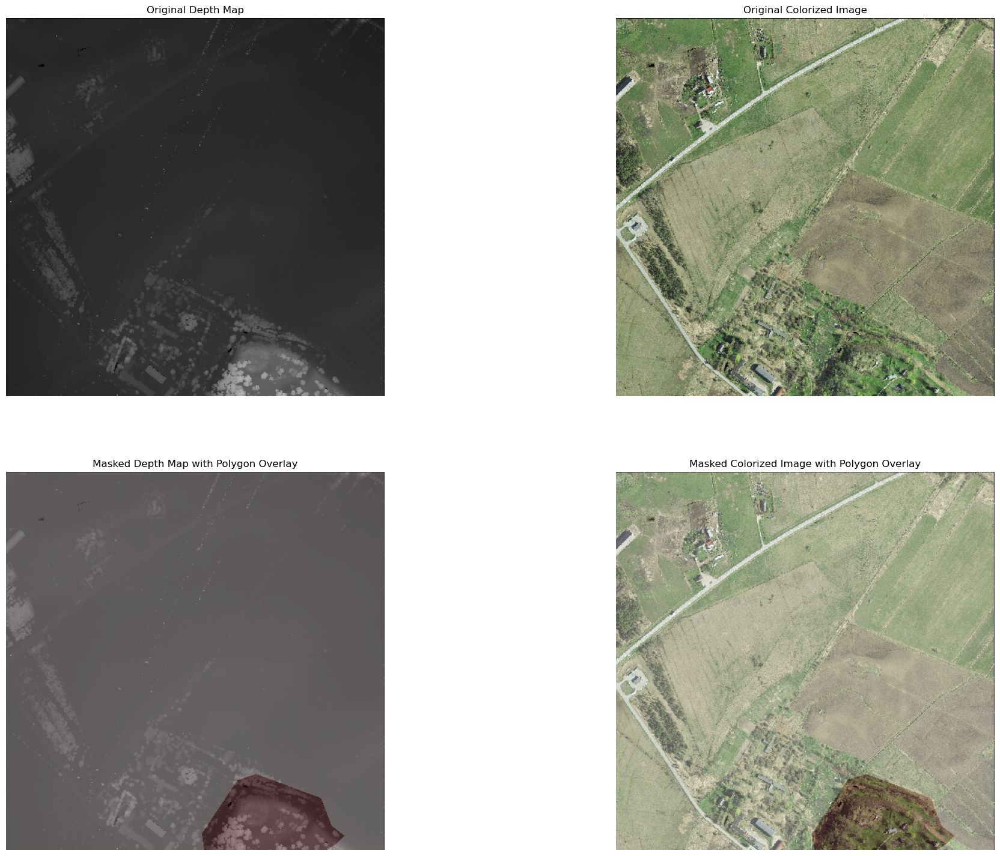

In [ ]:
# Overlay polygon mask onto depth map and colorized image
masked_depth_map = np.where(polygon_mask == 1, 255, depth_map_normalized)
masked_color_image = np.copy(color_image)
masked_color_image[polygon_mask == 1] = [255, 0, 0]  # Highlight mask in red

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(24, 18))

# Original Depth Map
axs[0, 0].imshow(np.flip(depth_map_normalized, axis=0), cmap='gray')
axs[0, 0].set_title('Original Depth Map')
axs[0, 0].axis('off')

# Original Colorized Image
axs[0, 1].imshow(np.flip(color_image, axis=0))
axs[0, 1].set_title('Original Colorized Image')
axs[0, 1].axis('off')

# Masked Depth Map
axs[1, 0].imshow(np.flip(depth_map_normalized, axis=0), cmap='gray')
axs[1, 0].imshow(np.flip(polygon_mask, axis=0), cmap='Reds', alpha=0.25)  # Overlay with transparency
axs[1, 0].set_title('Masked Depth Map with Polygon Overlay')
axs[1, 0].axis('off')

# Masked Colorized Image
axs[1, 1].imshow(np.flip(color_image, axis=0))
axs[1, 1].imshow(np.flip(polygon_mask, axis=0), cmap='Reds', alpha=0.25)  # Overlay with transparency
axs[1, 1].set_title('Masked Colorized Image with Polygon Overlay')
axs[1, 1].axis('off')

plt.show()

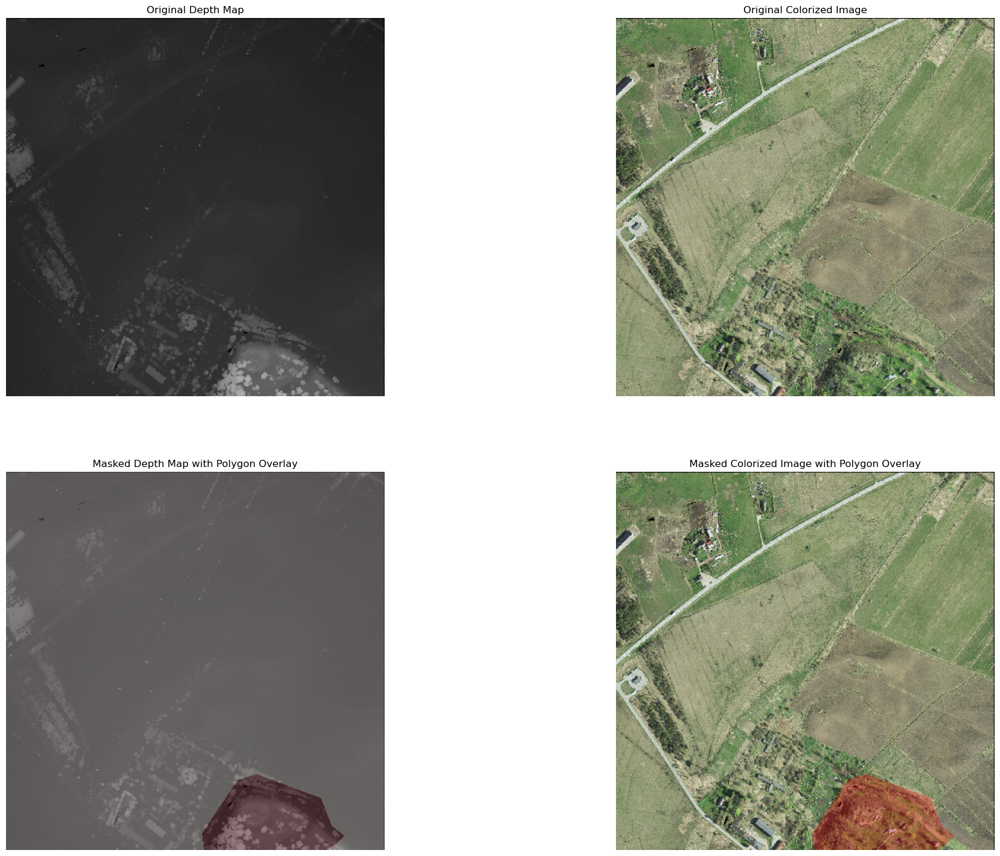

In [ ]:
# Define the mask color (e.g., red)
mask_color = [255, 0, 0]  # Red in RGB
alpha = 0.3  # Transparency level

# Apply transparency to the colorized image
masked_color_image = apply_transparency(np.flip(color_image, axis=0), np.flip(polygon_mask, axis=0), mask_color, alpha)

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(24, 18))

# Original Depth Map
axs[0, 0].imshow(np.flip(depth_map_normalized, axis=0), cmap='gray')
axs[0, 0].set_title('Original Depth Map')
axs[0, 0].axis('off')

# Original Colorized Image
axs[0, 1].imshow(np.flip(color_image, axis=0))
axs[0, 1].set_title('Original Colorized Image')
axs[0, 1].axis('off')

# Masked Depth Map
axs[1, 0].imshow(np.flip(depth_map_normalized, axis=0), cmap='gray')
axs[1, 0].imshow(np.flip(polygon_mask, axis=0), cmap='Reds', alpha=0.25)  # Overlay transparency
axs[1, 0].set_title('Masked Depth Map with Polygon Overlay')
axs[1, 0].axis('off')

# Masked Colorized Image
axs[1, 1].imshow(masked_color_image)
axs[1, 1].set_title('Masked Colorized Image with Polygon Overlay')
axs[1, 1].axis('off')

plt.show()

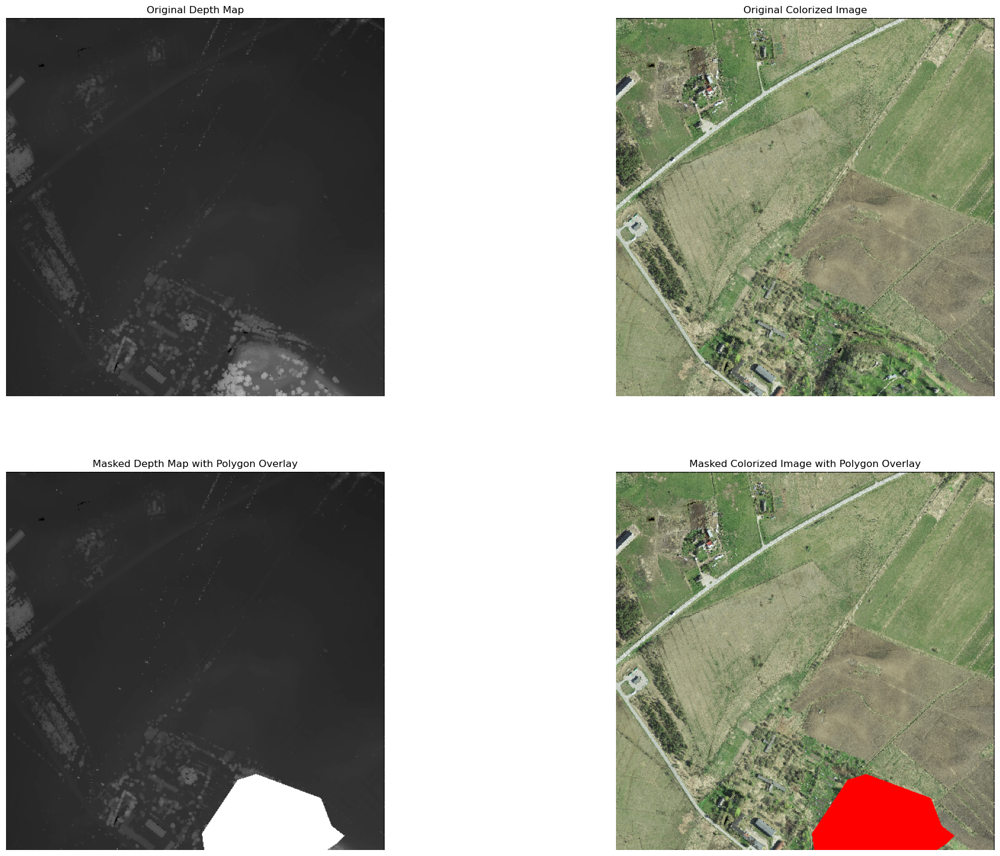

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(24, 18))

axs[0, 0].imshow(np.flip(depth_map_normalized, axis=0), cmap='gray')
axs[0, 0].set_title('Original Depth Map')
axs[0, 0].axis('off')

# Original Colorized Image
axs[0, 1].imshow(np.flip(color_image, axis=0))
axs[0, 1].set_title('Original Colorized Image')
axs[0, 1].axis('off')

# Masked Depth Map
axs[1, 0].imshow(np.flip(masked_depth_map, axis=0), cmap='gray')
axs[1, 0].set_title('Masked Depth Map with Polygon Overlay')
axs[1, 0].axis('off')

# Masked Colorized Image
axs[1, 1].imshow(np.flip(masked_color_image, axis=0))
axs[1, 1].set_title('Masked Colorized Image with Polygon Overlay')
axs[1, 1].axis('off')

plt.show()

In [ ]:
# Load the Shapefile
gdf_inspire = gpd.read_file('../data/PS_ProtectedSite_malestisedPolygon.shp')
gdf_kpois = gpd.read_file('../data/kma_avalik_muinsuskaitse_241_1007-polygons.shp')

In [15]:
# Inspect the first few rows of the GeoDataFrame
display(gdf_inspire.head())
display
display(gdf_inspire[gdf_inspire['sitename_g'] == 'Linnus "Aakre Kivivare linnamägi"']['geometry'])

,gml_id,gml_descri,gml_metada,gml_metad0,gml_origin,gml_parent,inspireid_,inspireid0,sitedesign,sitedesig0,sitedesig1,sitedesig2,sitename_g,sitename_0,siteprotec,xml_ns_uri,legalfound,legalfoun0,geometry
0,mka_11997874,Last update:2024-08-26,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti kultuurimälestiste register,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,mka_11997874,ee.mka.ps.registermuinas-malestised,https://inspire.ec.europa.eu/codelist/National...,monument,https://inspire.ec.europa.eu/codelist/Designat...,national monuments record,Kääbas,est,archaeological,http://inspire.ec.europa.eu/schemas/ps/4.0,true,true,"POLYGON ((701009.29 6415775.3, 701010.57 64157..."
1,mka_11997875,Last update:2024-08-26,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti kultuurimälestiste register,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,mka_11997875,ee.mka.ps.registermuinas-malestised,https://inspire.ec.europa.eu/codelist/National...,monument,https://inspire.ec.europa.eu/codelist/Designat...,national monuments record,Kääbas,est,archaeological,http://inspire.ec.europa.eu/schemas/ps/4.0,true,true,"POLYGON ((701019.53 6415786.11, 701021.31 6415..."
2,mka_11997876,Last update:2024-08-26,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti kultuurimälestiste register,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,mka_11997876,ee.mka.ps.registermuinas-malestised,https://inspire.ec.europa.eu/codelist/National...,monument,https://inspire.ec.europa.eu/codelist/Designat...,national monuments record,Kääbas,est,archaeological,http://inspire.ec.europa.eu/schemas/ps/4.0,true,true,"POLYGON ((701015.43 6415752.13, 700998.44 6415..."
3,mka_11997877,Last update:2024-08-26,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti kultuurimälestiste register,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,mka_11997877,ee.mka.ps.registermuinas-malestised,https://inspire.ec.europa.eu/codelist/National...,monument,https://inspire.ec.europa.eu/codelist/Designat...,national monuments record,Kääbas,est,archaeological,http://inspire.ec.europa.eu/schemas/ps/4.0,true,true,"POLYGON ((700959.86 6415755.76, 700965.12 6415..."
4,mka_11997879,Last update:2024-08-26,https://metadata.geoportaal.ee/geonetwork/srv/...,Eesti kultuurimälestiste register,http://www.opengis.net/def/crs/EPSG/0/3301,featureMember,mka_11997879,ee.mka.ps.registermuinas-malestised,https://inspire.ec.europa.eu/codelist/National...,monument,https://inspire.ec.europa.eu/codelist/Designat...,national monuments record,Kääbas,est,archaeological,http://inspire.ec.europa.eu/schemas/ps/4.0,true,true,"POLYGON ((700981.56 6415774.09, 700983.26 6415..."


586    POLYGON ((631888.22 6439387.11, 631895.55 6439...
Name: geometry, dtype: geometry

In [16]:
gdf_inspire[gdf_inspire['sitename_g'] == 'Lihula mõisa park']['geometry']

1534    POLYGON ((490610.45 6505860.8, 490602.27 65058...
Name: geometry, dtype: geometry

(490517.749999543, 6505860.799812593, 490894.9299995611, 6506200.289812606)


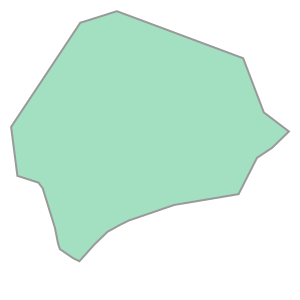

In [ ]:
print(gdf_inspire.iloc[1534].geometry.bounds)
display(gdf_inspire.iloc[1534].geometry)

In [ ]:
gdf_kpois['nimi'].info()
display(gdf_kpois['nimi'].isna().sum())

<class 'pandas.core.series.Series'>
RangeIndex: 5031 entries, 0 to 5030
Series name: nimi
Non-Null Count  Dtype 
--------------  ----- 
1992 non-null   object
dtypes: object(1)
memory usage: 39.4+ KB


3039

In [ ]:
gdf_inspire['sitename_g'].info()
display(gdf_inspire['sitename_g'].isna().sum())

<class 'pandas.core.series.Series'>
RangeIndex: 5092 entries, 0 to 5091
Series name: sitename_g
Non-Null Count  Dtype 
--------------  ----- 
5092 non-null   object
dtypes: object(1)
memory usage: 39.9+ KB


0

In [ ]:
'Lihula mõisa park' in gdf_kpois['nimi'].unique()

True

In [ ]:
'Linnus "Aakre Kivivare linnamägi"' in gdf_kpois['nimi'].unique()

False

In [ ]:
'Linnus "Aakre Kivivare linnamägi"' in gdf_inspire['sitename_g'].unique()

True

In [ ]:
'Lihula mõisa park' in gdf_inspire['sitename_g'].unique()

True

In [ ]:
linnamaed = pd.read_csv('./linnamagede_ruudunumbrid.csv', sep=',')

In [ ]:
linnamaed

,Linnamägi,Ruudunumber,Lisainfo
0,Kivivarre Liinamägi,439631,NaN
1,Agemäe linnus,465667,"pole kaardil märgitud, ruudu ülemises vasakus ..."
2,Ahisilla linnusekoht,562567,"pole kaardil märgitud, Soone tn 6 kinnistul"
3,Akupere linnus,NaN,kaardil tuvastamatu
4,Alatskivi Kalevipoja säng,500680,ruudu ülemises paremas nurgas
...,...,...,...
142,Kaloga Jaanimägi,404681,mitte kõrval olev Liinamägi
143,Valgjärve järveasula,441656,"ruudu vasakul üleval, järvel kaks saart"
144,Karksi lossimägi,441592,NaN
145,Tarvastu ordulinnus,456611,NaN


In [ ]:
count = 0
for i, rida_i in enumerate(linnamaed.iterrows()):
    if rida_i[1].isna().all(): break
    if gdf_inspire['sitename_g'].str.contains(rida_i[1]['Linnamägi'], na=False).any():
        count+=1
print(count, '/', linnamaed.shape[0])

17 / 147
